In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,15)

X_train Shape : (12033, 15, 1)
y_train Shape : (12033, 1)
X_test Shape :  (3013, 15, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [32]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 12ms/step - loss: 0.0096 - val_loss: 0.0039
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0025 - val_loss: 0.0033
Epoch 3/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0020 - val_loss: 0.0031
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.00

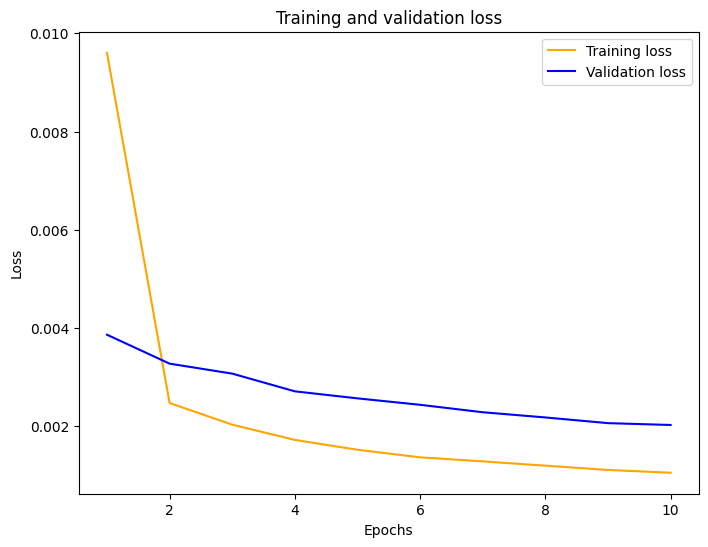

In [33]:
plot_curve(hist_adam)

In [34]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.548369,0.554215
1,2021-12-10 15:25:00,0.588,0.531851,0.537816
2,2021-12-10 15:26:00,0.566,0.572269,0.591537
3,2021-12-10 15:27:00,0.562,0.567707,0.567834
4,2021-12-10 15:28:00,0.612,0.558541,0.563927
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.167414
3009,2021-12-16 13:59:00,0.169,0.171736,0.167294
3010,2021-12-16 14:00:00,0.147,0.172230,0.168243
3011,2021-12-16 14:01:00,0.145,0.158117,0.147418


In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [36]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0020141679328253286

In [112]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','mse error'])

data = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_adam}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\863098028.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [22]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 14s 19ms/step - loss: 0.0058 - val_loss: 0.0033
Epoch 2/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0018 - val_loss: 0.0032
Epoch 3/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 4/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0025
Epoch 5/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 7ms/step - loss: 0.0010 - val_loss: 0.00

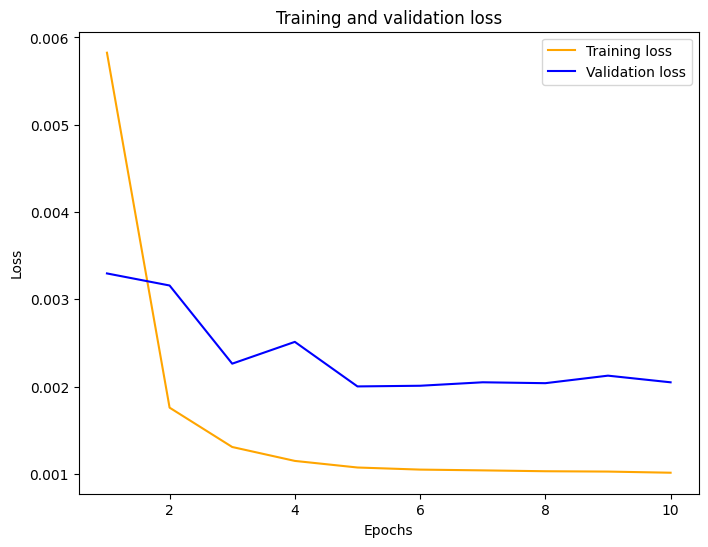

In [23]:
plot_curve(hist_50_rms)

In [24]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.515312,0.554215
1,2021-12-10 15:25:00,0.588,0.500896,0.537816
2,2021-12-10 15:26:00,0.566,0.547359,0.591537
3,2021-12-10 15:27:00,0.562,0.531968,0.567834
4,2021-12-10 15:28:00,0.612,0.524465,0.563927
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.149357,0.167414
3009,2021-12-16 13:59:00,0.169,0.149022,0.167294
3010,2021-12-16 14:00:00,0.147,0.149762,0.168243
3011,2021-12-16 14:01:00,0.145,0.132881,0.147418


In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [38]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002039


In [113]:
data1 = [{'Lags':15 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\1407002937.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [40]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
189/189 [==============================] - 9s 16ms/step - loss: 0.0115 - val_loss: 0.0043
Epoch 2/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0031 - val_loss: 0.0038
Epoch 3/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0026 - val_loss: 0.0034
Epoch 4/10
189/189 [==============================] - 2s 11ms/step - loss: 0.0022 - val_loss: 0.0032
Epoch 5/10
189/189 [==============================] - 2s 11ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 6/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0018 - val_loss: 0.0029
Epoch 7/10
189/189 [==============================] - 2s 11ms/step - loss: 0.0017 - val_loss: 0.0030
Epoch 8/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 9/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 10/10
189/189 [==============================] - 2s 12ms/step - loss: 0.0014 - val_lo

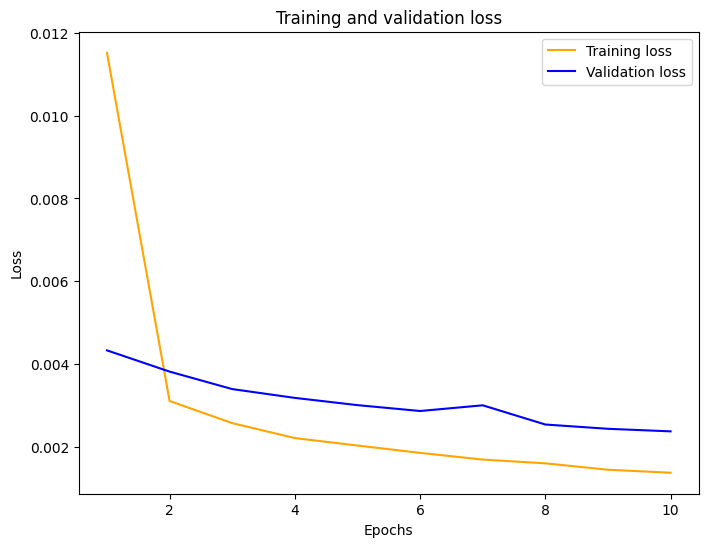

In [41]:
plot_curve(hist_batch_size64)

In [42]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.548369,0.554215,0.582499
1,2021-12-10 15:25:00,0.588,0.531851,0.537816,0.552565
2,2021-12-10 15:26:00,0.566,0.572269,0.591537,0.566158
3,2021-12-10 15:27:00,0.562,0.567707,0.567834,0.570125
4,2021-12-10 15:28:00,0.612,0.558541,0.563927,0.571869
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.167414,0.172285
3009,2021-12-16 13:59:00,0.169,0.171736,0.167294,0.171955
3010,2021-12-16 14:00:00,0.147,0.172230,0.168243,0.172256
3011,2021-12-16 14:01:00,0.145,0.158117,0.147418,0.163493


In [43]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [44]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002356


In [114]:
data2 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\2777055183.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356


---

### learning rate 0.1

In [46]:
test2 = test.copy()

#### Add frist layer: units = 50

In [47]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 12ms/step - loss: 0.0450 - val_loss: 0.0025
Epoch 2/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0018 - val_loss: 0.0038
Epoch 3/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0086
Epoch 5/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0374 - val_loss: 0.0025
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 8/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 9/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0018 - val_loss: 0.0

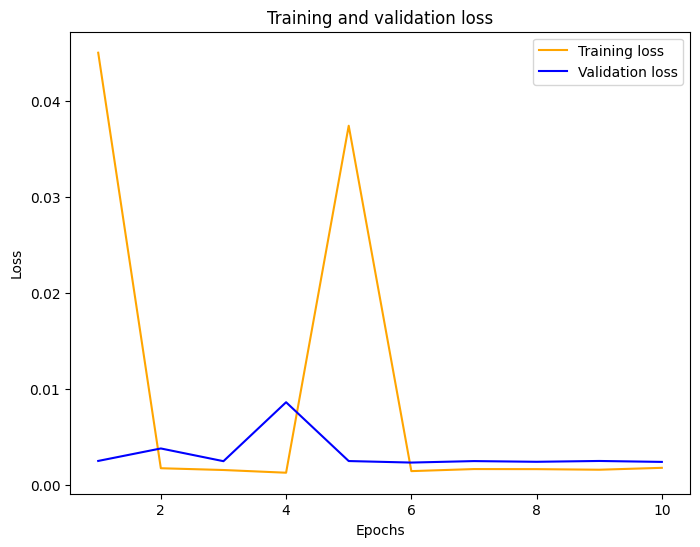

In [48]:
plot_curve(hist_01)

In [49]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.546670
1,2021-12-10 15:25:00,0.588,0.520202
2,2021-12-10 15:26:00,0.566,0.595128
3,2021-12-10 15:27:00,0.562,0.538841
4,2021-12-10 15:28:00,0.612,0.555342
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.160040
3009,2021-12-16 13:59:00,0.169,0.160603
3010,2021-12-16 14:00:00,0.147,0.161483
3011,2021-12-16 14:01:00,0.145,0.136785


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [51]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002401


In [115]:
data3 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\102788554.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [53]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 9s 11ms/step - loss: 0.0145 - val_loss: 0.0024
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 3/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0012 - val_loss: 0.0025
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0027
Epoch 5/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0

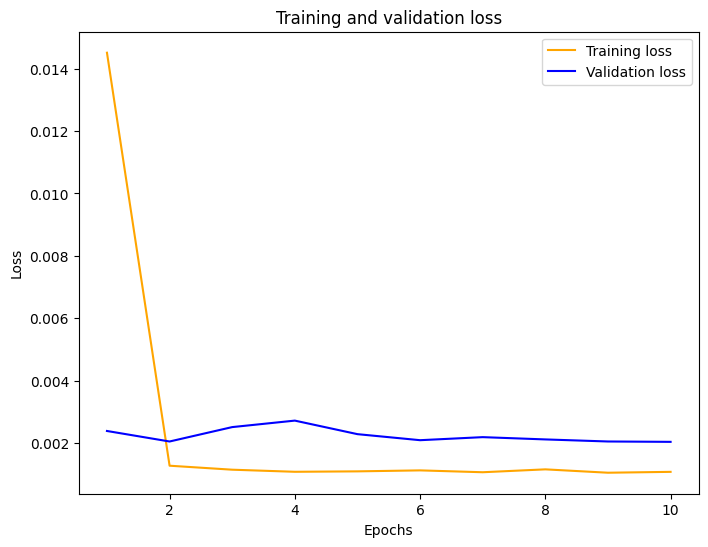

In [54]:
plot_curve(hist_005)

In [55]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.546670,0.552735
1,2021-12-10 15:25:00,0.588,0.520202,0.535379
2,2021-12-10 15:26:00,0.566,0.595128,0.591362
3,2021-12-10 15:27:00,0.562,0.538841,0.566345
4,2021-12-10 15:28:00,0.612,0.555342,0.562712
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.160040,0.171989
3009,2021-12-16 13:59:00,0.169,0.160603,0.172029
3010,2021-12-16 14:00:00,0.147,0.161483,0.172886
3011,2021-12-16 14:01:00,0.145,0.136785,0.150393


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002032


In [116]:
data4 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\3695036855.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [59]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 10s 11ms/step - loss: 0.0042 - val_loss: 0.0029
Epoch 2/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
377/377 [==============================] - 5s 15ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0010 - val_loss: 0

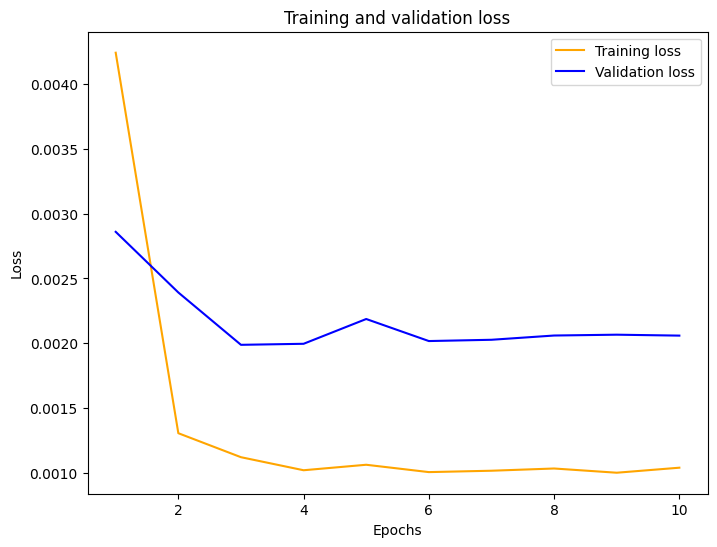

In [60]:
plot_curve(hist_001)

In [61]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.546670,0.552735,0.552208
1,2021-12-10 15:25:00,0.588,0.520202,0.535379,0.535189
2,2021-12-10 15:26:00,0.566,0.595128,0.591362,0.592101
3,2021-12-10 15:27:00,0.562,0.538841,0.566345,0.563070
4,2021-12-10 15:28:00,0.612,0.555342,0.562712,0.561640
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.160040,0.171989,0.168047
3009,2021-12-16 13:59:00,0.169,0.160603,0.172029,0.168049
3010,2021-12-16 14:00:00,0.147,0.161483,0.172886,0.169108
3011,2021-12-16 14:01:00,0.145,0.136785,0.150393,0.146543


In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [63]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002049


In [117]:
data = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\2249725511.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [65]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 10ms/step - loss: 0.0041 - val_loss: 0.0042
Epoch 2/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 3/10
377/377 [==============================] - 4s 9ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 4/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 9.8410e-04 - val_loss: 0.0020
Epoch 6/10
377/377 [==============================] - 3s 9ms/step - loss: 9.8012e-04 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 3s 8ms/step - loss: 9.9460e-04 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 9.6035e-04 -

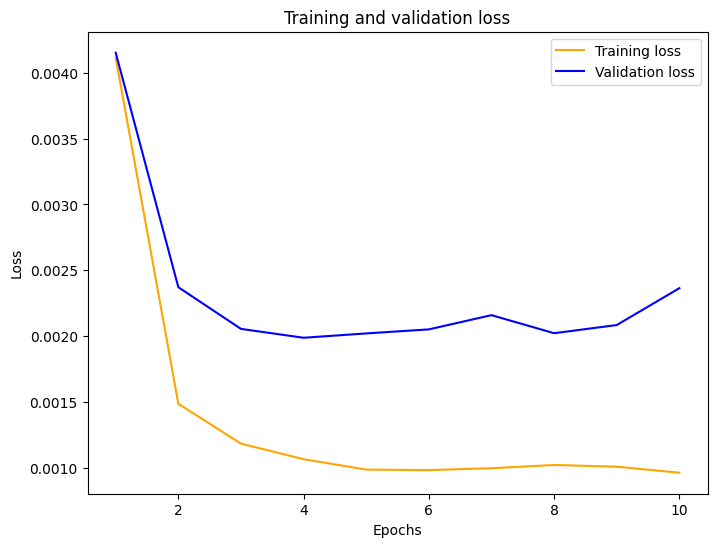

In [66]:
plot_curve(hist_0005)

In [67]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.546670,0.552735,0.552208,0.529843
1,2021-12-10 15:25:00,0.588,0.520202,0.535379,0.535189,0.513985
2,2021-12-10 15:26:00,0.566,0.595128,0.591362,0.592101,0.567163
3,2021-12-10 15:27:00,0.562,0.538841,0.566345,0.563070,0.542669
4,2021-12-10 15:28:00,0.612,0.555342,0.562712,0.561640,0.539320
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.160040,0.171989,0.168047,0.155121
3009,2021-12-16 13:59:00,0.169,0.160603,0.172029,0.168049,0.154993
3010,2021-12-16 14:00:00,0.147,0.161483,0.172886,0.169108,0.155979
3011,2021-12-16 14:01:00,0.145,0.136785,0.150393,0.146543,0.135219


In [68]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [69]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002352


In [118]:
data5 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\1396156706.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [71]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 8s 10ms/step - loss: 0.0124 - val_loss: 0.0044
Epoch 2/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0029 - val_loss: 0.0036
Epoch 3/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0023 - val_loss: 0.0032
Epoch 4/10
377/377 [==============================] - 3s 9ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 6/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 7/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 3s 8ms/step - loss: 0.0011 - val_loss: 0.002

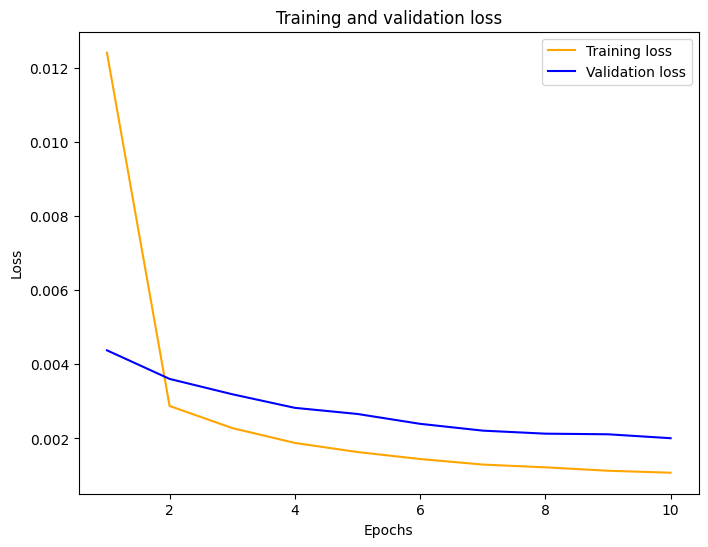

In [72]:
plot_curve(hist_0001)

In [73]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.546670,0.552735,0.552208,0.529843,0.552208
1,2021-12-10 15:25:00,0.588,0.520202,0.535379,0.535189,0.513985,0.535189
2,2021-12-10 15:26:00,0.566,0.595128,0.591362,0.592101,0.567163,0.592101
3,2021-12-10 15:27:00,0.562,0.538841,0.566345,0.563070,0.542669,0.563070
4,2021-12-10 15:28:00,0.612,0.555342,0.562712,0.561640,0.539320,0.561640
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.160040,0.171989,0.168047,0.155121,0.168047
3009,2021-12-16 13:59:00,0.169,0.160603,0.172029,0.168049,0.154993,0.168049
3010,2021-12-16 14:00:00,0.147,0.161483,0.172886,0.169108,0.155979,0.169108
3011,2021-12-16 14:01:00,0.145,0.136785,0.150393,0.146543,0.135219,0.146543


In [74]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [75]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.0020141679328253286


,Model,MSE error
0,model,0.002014
1,model_1,0.002049


In [119]:
data6 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\3189332392.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [77]:
test3 = test.copy()

In [78]:
test3['LSTM_50'] = predict_adam

In [79]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 10s 14ms/step - loss: 0.0093 - val_loss: 0.0039
Epoch 2/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0024 - val_loss: 0.0032
Epoch 3/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 4/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 7/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
377/377 [==============================] - 5s 13ms/step - loss: 9.8469e-04 - v

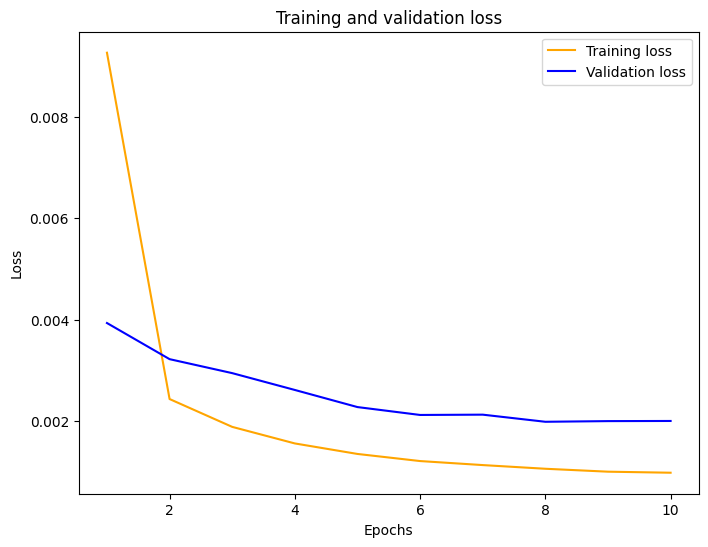

In [80]:
plot_curve(hist_1)

In [81]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.548369,0.555033
1,2021-12-10 15:25:00,0.588,0.531851,0.540605
2,2021-12-10 15:26:00,0.566,0.572269,0.588923
3,2021-12-10 15:27:00,0.562,0.567707,0.567552
4,2021-12-10 15:28:00,0.612,0.558541,0.561024
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.173906
3009,2021-12-16 13:59:00,0.169,0.171736,0.173630
3010,2021-12-16 14:00:00,0.147,0.172230,0.174526
3011,2021-12-16 14:01:00,0.145,0.158117,0.155555


In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [83]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.001995120082890836


,Model,MSE error
0,model,0.002014
1,model_1,0.001995


In [120]:
data7 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\3433211926.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049
8,15,Adam,32,,100,,,,,1,10,0.001995


------------

### Add frist layer: units = 100 and Add Dropout = 0.1

In [85]:
model_2 = Sequential()
model_2.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 11s 17ms/step - loss: 0.0098 - val_loss: 0.0041
Epoch 2/10
377/377 [==============================] - 5s 13ms/step - loss: 0.0032 - val_loss: 0.0036
Epoch 3/10
377/377 [==============================] - 4s 11ms/step - loss: 0.0027 - val_loss: 0.0031
Epoch 4/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0022 - val_loss: 0.0028
Epoch 5/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0021 - val_loss: 0.0026
Epoch 6/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 5s 12ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 8/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 9/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 4s 12ms/step - loss: 0.0014 - val_l

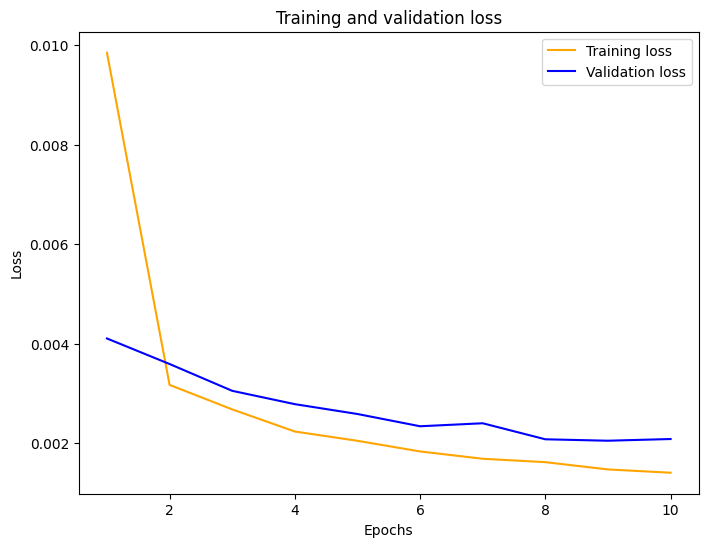

In [86]:
plot_curve(hist_2)

In [87]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.548369,0.555033,0.543471
1,2021-12-10 15:25:00,0.588,0.531851,0.540605,0.527075
2,2021-12-10 15:26:00,0.566,0.572269,0.588923,0.566481
3,2021-12-10 15:27:00,0.562,0.567707,0.567552,0.557463
4,2021-12-10 15:28:00,0.612,0.558541,0.561024,0.549235
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.173906,0.173179
3009,2021-12-16 13:59:00,0.169,0.171736,0.173630,0.172649
3010,2021-12-16 14:00:00,0.147,0.172230,0.174526,0.173191
3011,2021-12-16 14:01:00,0.145,0.158117,0.155555,0.158402


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_100_drop_out)

Better MSE value is :  0.001995120082890836


,Model,MSE error
0,model,0.001995
1,model_1,0.002076


In [121]:
data8 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_100_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\3832636012.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049
8,15,Adam,32,,100,,,,,1,10,0.001995
9,15,Adam,32,,100,0.1,,,,1,10,0.002076


------------------------------------

### Add frist layer: units = 100 and Add second layer: unit = 50

In [91]:
model_3 = Sequential()
model_3.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
377/377 [==============================] - 23s 31ms/step - loss: 0.0070 - val_loss: 0.0039
Epoch 2/10
377/377 [==============================] - 9s 25ms/step - loss: 0.0024 - val_loss: 0.0032
Epoch 3/10
377/377 [==============================] - 10s 26ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 4/10
377/377 [==============================] - 9s 25ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 5/10
377/377 [==============================] - 9s 25ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 6/10
377/377 [==============================] - 10s 26ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 7/10
377/377 [==============================] - 10s 27ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 8/10
377/377 [==============================] - 10s 27ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
377/377 [==============================] - 10s 27ms/step - loss: 9.9034e-04 - val_loss: 0.0021
Epoch 10/10
377/377 [==============================] - 12s 32ms/step - loss: 0.00

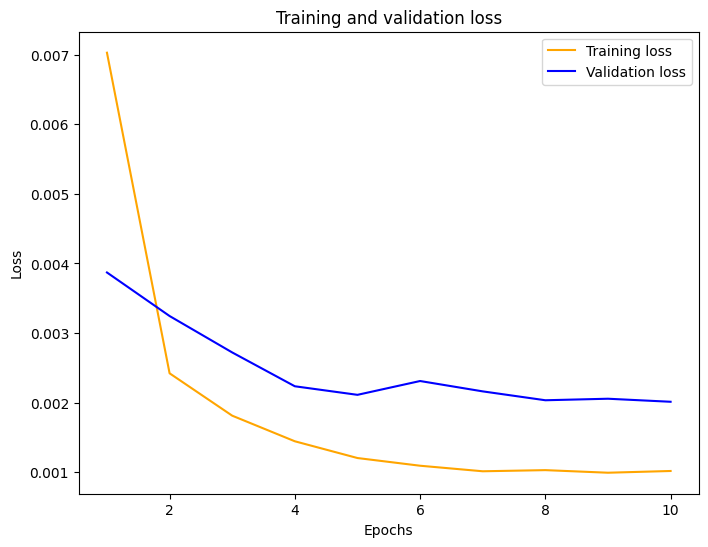

In [92]:
plot_curve(hist_3)

In [93]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.548369,0.555033,0.543471,0.548944
1,2021-12-10 15:25:00,0.588,0.531851,0.540605,0.527075,0.531639
2,2021-12-10 15:26:00,0.566,0.572269,0.588923,0.566481,0.580728
3,2021-12-10 15:27:00,0.562,0.567707,0.567552,0.557463,0.557431
4,2021-12-10 15:28:00,0.612,0.558541,0.561024,0.549235,0.554160
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.173906,0.173179,0.166361
3009,2021-12-16 13:59:00,0.169,0.171736,0.173630,0.172649,0.166082
3010,2021-12-16 14:00:00,0.147,0.172230,0.174526,0.173191,0.166853
3011,2021-12-16 14:01:00,0.145,0.158117,0.155555,0.158402,0.149126


In [94]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [95]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_second_layer)

Better MSE value is :  0.001995120082890836


,Model,MSE error
0,model,0.001995
1,model_1,0.002001


In [122]:
data10 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\2280351685.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049
8,15,Adam,32,,100,,,,,1,10,0.001995
9,15,Adam,32,,100,0.1,,,,1,10,0.002076


---

### Add frist layer: units = 100 and change epochs from 10 to 20

In [123]:
model_5 = Sequential()
model_5.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
377/377 [==============================] - 8s 14ms/step - loss: 0.0079 - val_loss: 0.0041
Epoch 2/20
377/377 [==============================] - 4s 11ms/step - loss: 0.0024 - val_loss: 0.0032
Epoch 3/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 4/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0014 - val_loss: 0.0025
Epoch 6/20
377/377 [==============================] - 4s 11ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 7/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 9/20
377/377 [==============================] - 4s 10ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/20
377/377 [==============================] - 4s 10ms/step - loss: 9.8161e-04 - va

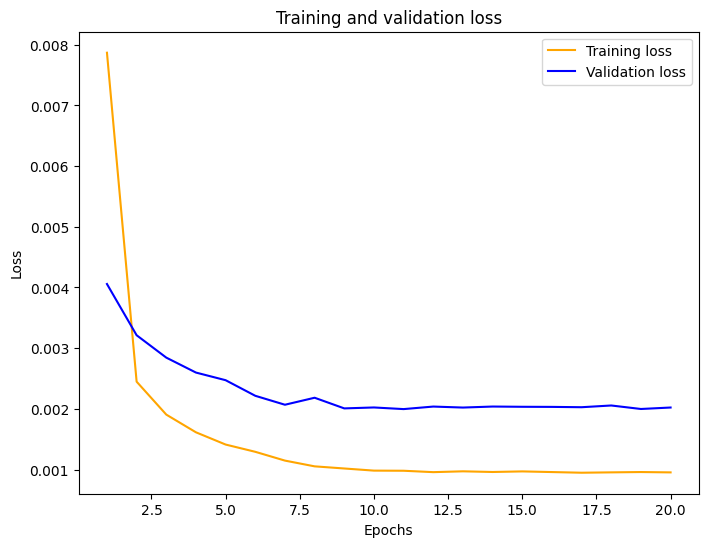

In [124]:
plot_curve(hist_5)

In [125]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.548369,0.555033,0.543471,0.549300,0.562505
1,2021-12-10 15:25:00,0.588,0.531851,0.540605,0.527075,0.532943,0.541445
2,2021-12-10 15:26:00,0.566,0.572269,0.588923,0.566481,0.583245,0.595548
3,2021-12-10 15:27:00,0.562,0.567707,0.567552,0.557463,0.560070,0.560978
4,2021-12-10 15:28:00,0.612,0.558541,0.561024,0.549235,0.556774,0.564748
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.172178,0.173906,0.173179,0.172039,0.168106
3009,2021-12-16 13:59:00,0.169,0.171736,0.173630,0.172649,0.171793,0.168232
3010,2021-12-16 14:00:00,0.147,0.172230,0.174526,0.173191,0.172590,0.169104
3011,2021-12-16 14:01:00,0.145,0.158117,0.155555,0.158402,0.154735,0.147834


In [126]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [127]:
lstm_mse_error_unit_100_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_unit_100,lstm_mse_error_unit_100_epoch20)

Better MSE value is :  0.001995120082890836


,Model,MSE error
0,model,0.001995
1,model_1,0.002012


In [128]:
data11 = [{'Lags':15 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_100_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_25808\1194901935.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049
8,15,Adam,32,,100,,,,,1,10,0.001995
9,15,Adam,32,,100,0.1,,,,1,10,0.002076


---

# save model

In [129]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')
mse_lstm

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [130]:
mse_data

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,15,Adam,32,,50,,,,,1,10,0.002014
1,15,RMSprop,32,,50,,,,,1,10,0.002039
2,15,Adam,64,,50,,,,,1,10,0.002356
3,15,Adam,32,0.1,50,,,,,1,10,0.002401
4,15,Adam,32,0.05,50,,,,,1,10,0.002032
5,15,Adam,32,0.01,50,,,,,1,10,0.002049
6,15,Adam,32,0.005,50,,,,,1,10,0.002352
7,15,Adam,32,0.001,50,,,,,1,10,0.002049
8,15,Adam,32,,100,,,,,1,10,0.001995
9,15,Adam,32,,100,0.1,,,,1,10,0.002076


In [131]:
mse_lags = pd.concat([mse_lstm,mse_data],ignore_index=True)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.01,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [132]:
mse_lags.to_csv('data_lstm_mse.csv',index=False)

In [133]:
mse_lstm1 = pd.read_csv('data_lstm_mse.csv')
mse_lstm1

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [134]:
mse = mse_lstm1.groupby(['Lags'])['mse error'].transform(min) == mse_lstm1['mse error']
mse_lstm1[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987
13,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002009
33,15,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001995


In [135]:
model_1.save('model_train_80%_lag15.h5')